# EEG data pre-processing
- Import Data
- Select EEG channels
    - Separate the 2 people
    - Only take the EEG channels
- Locate EEG
- Filtering
    - filter the data at 1HZ (high-pass it)
    - lowpass frequency 40HZ - need to check with Lars
    - (notch filter at 50 Hz to remove line noise) no longer needed
- Epoch the data (there are chunks that are not epoched)
    - epoch from -1 s before trigger to 25s after in MNE python
- Maybe narrow it down to 2-4 conditions
- Down sample to 265(?) khz (like in paper)
- Usually remove not working EEG channels
- Perform ICA on the data to have cleaner data
    - eye blinks and eye movements
- Reference

In [1]:
PAIR_NUMBER = "007"

## Importing data

In [2]:
import mne
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mne.preprocessing import ICA, corrmap, create_ecg_epochs, create_eog_epochs
from mne_icalabel import label_components

In [3]:
sample_data_folder = mne.datasets.sample.data_path()
sample_data_raw_file = ("raw_eeg/pair"+PAIR_NUMBER+"/"+PAIR_NUMBER +".bdf")
raw = mne.io.read_raw_bdf(sample_data_raw_file)

Extracting EDF parameters from /work3/s204684/raw_eeg/pair007/007.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...


In [4]:
# use just 600 seconds of data and mag channels, to save memory
#raw.crop(0, 600).pick_types(eeg=True, stim=True).load_data()

# Load Data into memory
raw.pick_types(eeg=True, stim=True).load_data()


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Reading 0 ... 6428671  =      0.000 ...  3139.000 secs...


<RawEDF | 007.bdf, 287 x 6428672 (3139.0 s), ~13.75 GB, data loaded>

In [5]:
print(raw)
print(raw.info)

<RawEDF | 007.bdf, 287 x 6428672 (3139.0 s), ~13.75 GB, data loaded>
<Info | 7 non-empty values
 bads: []
 ch_names: 1-A1, 1-A2, 1-A3, 1-A4, 1-A5, 1-A6, 1-A7, 1-A8, 1-A9, 1-A10, ...
 chs: 286 EEG, 1 Stimulus
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 417.0 Hz
 meas_date: 2020-02-01 13:25:51 UTC
 nchan: 287
 projs: []
 sfreq: 2048.0 Hz
>


## Select EEG channels

In [6]:
p1_channels = []
p2_channels = []

for i in range(1, 33):
    channel_A = "1-A" + str(i)
    channel_B = "1-B" + str(i)
    p1_channels.append(channel_A)
    p1_channels.append(channel_B)
    channel_A = "2-A" + str(i)
    channel_B = "2-B" + str(i)
    p2_channels.append(channel_A)
    p2_channels.append(channel_B)

# Pick Person 1 channels
p1_raw = raw.copy().pick_channels(p1_channels)

# Pick Person 2 channels
p2_raw = raw.copy().pick_channels(p2_channels)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/tmp/ipykernel_10948/3787381083.py:15: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  p1_raw = raw.copy().pick_channels(p1_channels)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/tmp/ipykernel_10948/3787381083.py:18: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  p2_raw = raw.copy().pick_channels(p2_channels)


#### Illustrations

Using matplotlib as 2D backend.


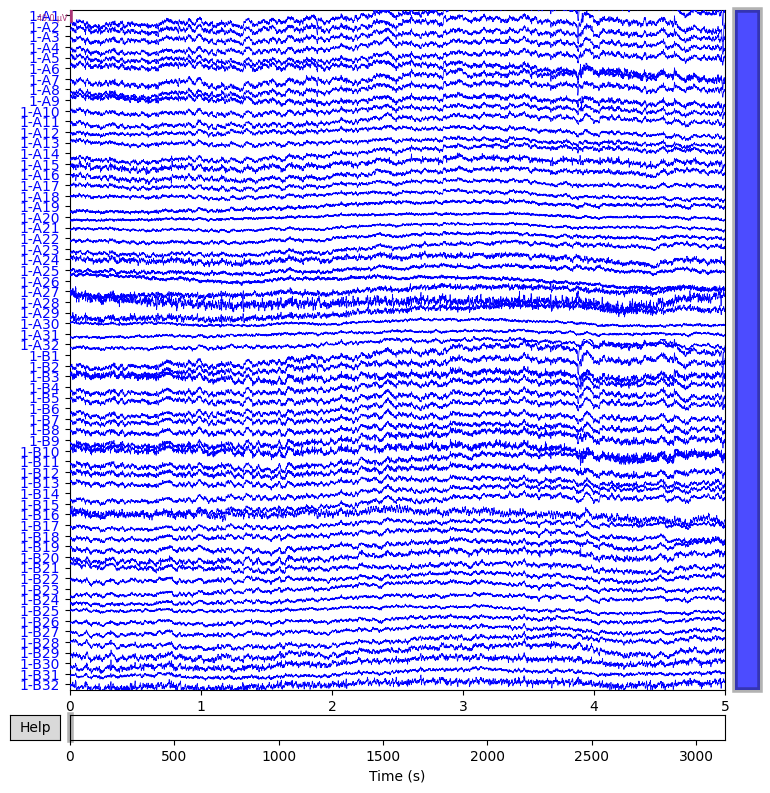

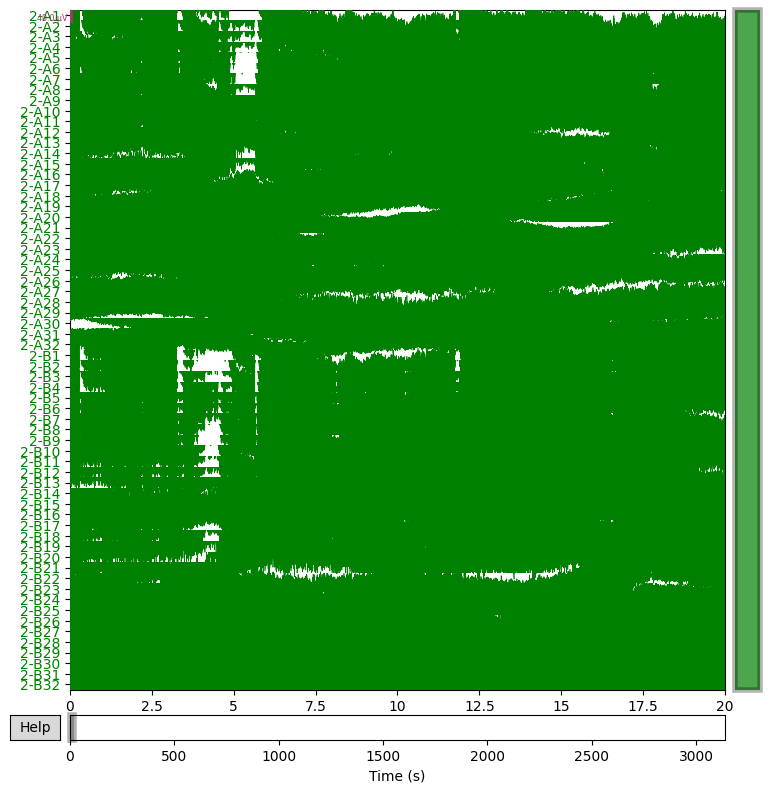

In [7]:
plot11 = mne.viz.plot_raw(p1_raw, duration=5, n_channels=64, color ="b", scalings=None, show = True)
plot12 = mne.viz.plot_raw(p2_raw, duration=20, n_channels=64, color ="g", scalings=None, show = True)

## Locate EEG channels

In [8]:
# Read the CSV file
csv_file_path = "EEG_locations.csv"
df = pd.read_csv(csv_file_path)

# Create a dictionary to map original names to renamed names
p1_channel_mapping = dict(zip(df["p1"], df["Renamed"]))
p2_channel_mapping = dict(zip(df["p2"], df["Renamed"]))

p1_raw = p1_raw.copy().rename_channels(p1_channel_mapping)
p2_raw = p2_raw.copy().rename_channels(p2_channel_mapping)

In [9]:
print(p1_raw.info)

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 417.0 Hz
 meas_date: 2020-02-01 13:25:51 UTC
 nchan: 64
 projs: []
 sfreq: 2048.0 Hz
>


In [10]:
biosemi_montage = mne.channels.make_standard_montage("biosemi64")
print(biosemi_montage)

<DigMontage | 0 extras (headshape), 0 HPIs, 3 fiducials, 64 channels>


In [11]:
p1_raw.set_montage(biosemi_montage)
p2_raw.set_montage(biosemi_montage)
p1_raw.set_eeg_reference(projection=True)  # needed for inverse modeling
p2_raw.set_eeg_reference(projection=True)  # needed for inverse modeling

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.


<RawEDF | 007.bdf, 64 x 6428672 (3139.0 s), ~3.07 GB, data loaded>

## Filter

In [12]:
#Only works if Preload = True, my laptop can't handle it
p1_raw_filtered = p1_raw.filter(l_freq=1, h_freq=40).notch_filter(freqs=50)
p2_raw_filtered = p2_raw.filter(l_freq=1, h_freq=40).notch_filter(freqs=50)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    4.1s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 13517 samples (6.600 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    4.3s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    4.1s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 13517 samples (6.600 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    4.3s


#### Illustrations

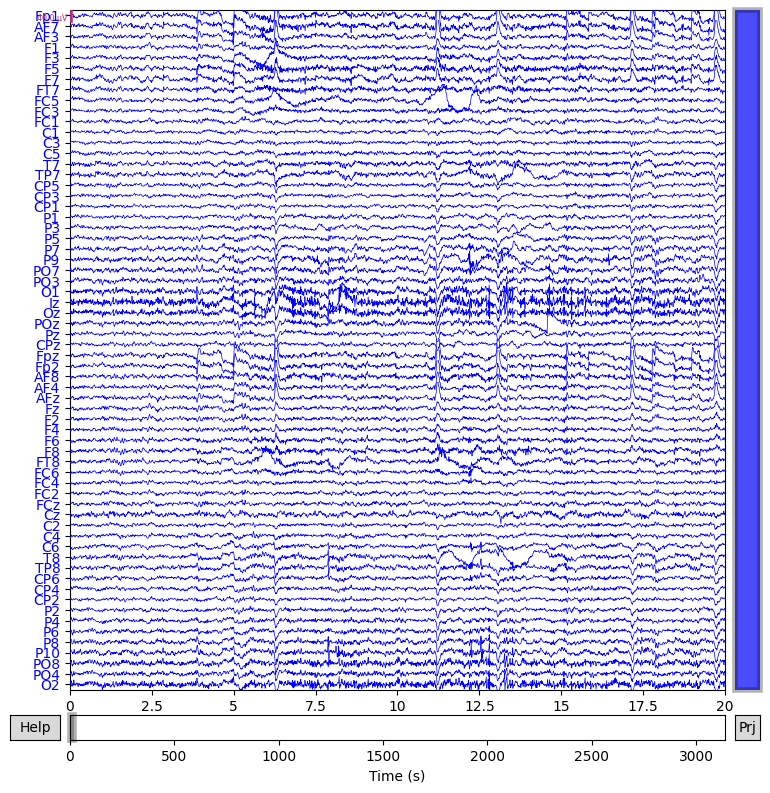

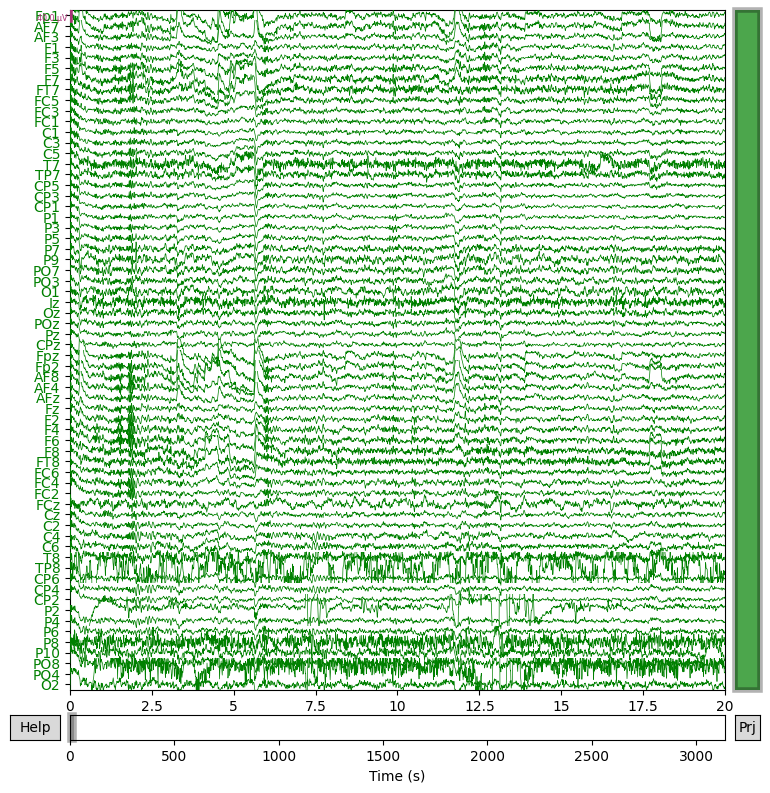

In [13]:
plot21 = mne.viz.plot_raw(p1_raw_filtered, duration=20, n_channels=64, scalings=None, show = True, color ="b", title="P1 Filtered EEG Data")
plot22 = mne.viz.plot_raw(p2_raw_filtered, duration=20, n_channels=64, scalings=None, show = True, color ="g",title="P2 Filtered EEG Data")

## Epochs

### Find Events

In [14]:
events = mne.find_events(raw)
print(events[:5])  # show the first 5

Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
165 events found
Event IDs: [  1 101 102 103 104 105 106 107 108]
[[  9118      0      1]
 [ 29787      0    101]
 [275560      0    101]
 [296120      0    107]
 [347327      0    107]]


#### Illustrations

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


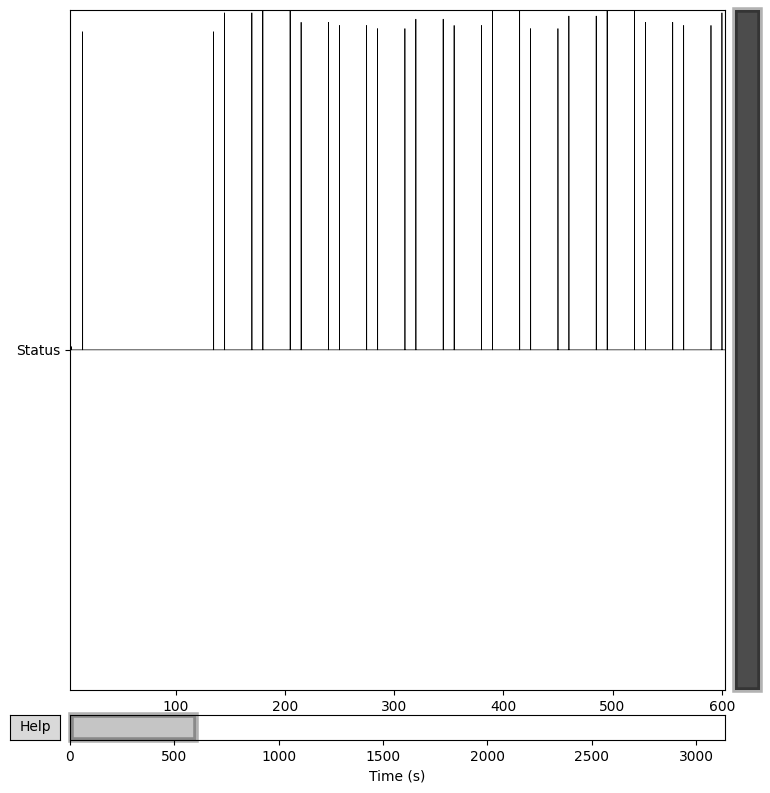

In [15]:
stimuli_raw = raw.copy().pick_types(meg=False, stim=True).plot(start=3, duration=600)

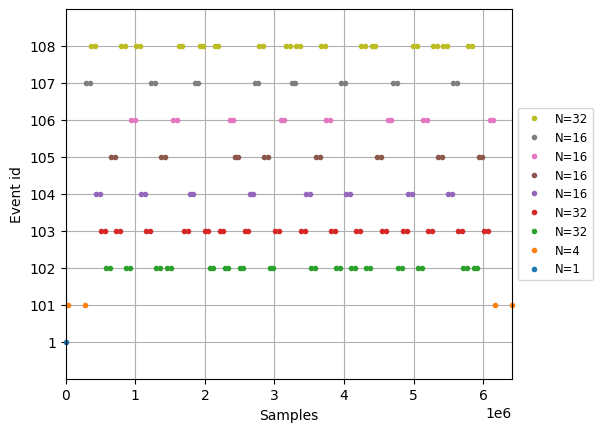

In [16]:
plot31 = mne.viz.plot_events(events)

### Epochs

In [17]:
event_ids = {"rest":101,
             "uncoupled":102,
             "coupled":103,
             "actorA/observerB":104,
             "actorB/observerA":106,
             "leaderA/followerB":107,
             "leaderB/followerA":105}

p1_epochs = mne.Epochs(p1_raw_filtered, events, event_ids, tmin=-1, tmax=25, baseline=(None, 0), preload=False)
p2_epochs = mne.Epochs(p2_raw_filtered, events, event_ids, tmin=-1, tmax=25, baseline=(None, 0), preload=False)

Not setting metadata
132 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Not setting metadata
132 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
Created an SSP operator (subspace dimension = 1)
1 projection items activated


#### Illustrations

Using data from preloaded Raw for 132 events and 53249 original time points ...
1 bad epochs dropped


/tmp/ipykernel_10948/2890496345.py:1: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot41 = p1_epochs.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


Using data from preloaded Raw for 2 events and 53249 original time points ...


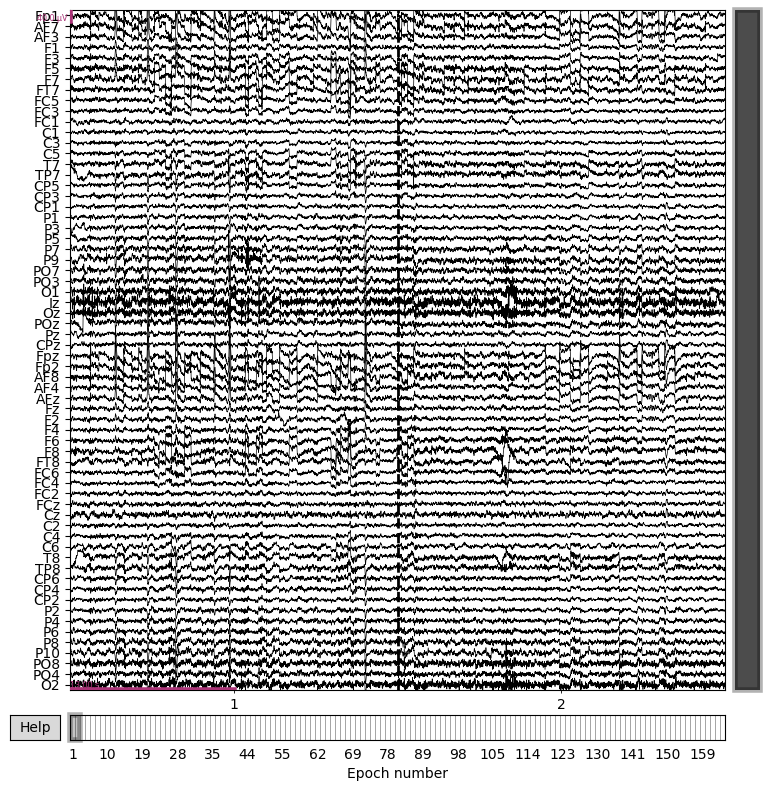

Using data from preloaded Raw for 132 events and 53249 original time points ...
1 bad epochs dropped


/tmp/ipykernel_10948/2890496345.py:2: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot42 = p2_epochs.plot(n_epochs=2, scalings=None, n_channels=64, event_color="b", title="Epochs plot", block=True)


Using data from preloaded Raw for 2 events and 53249 original time points ...


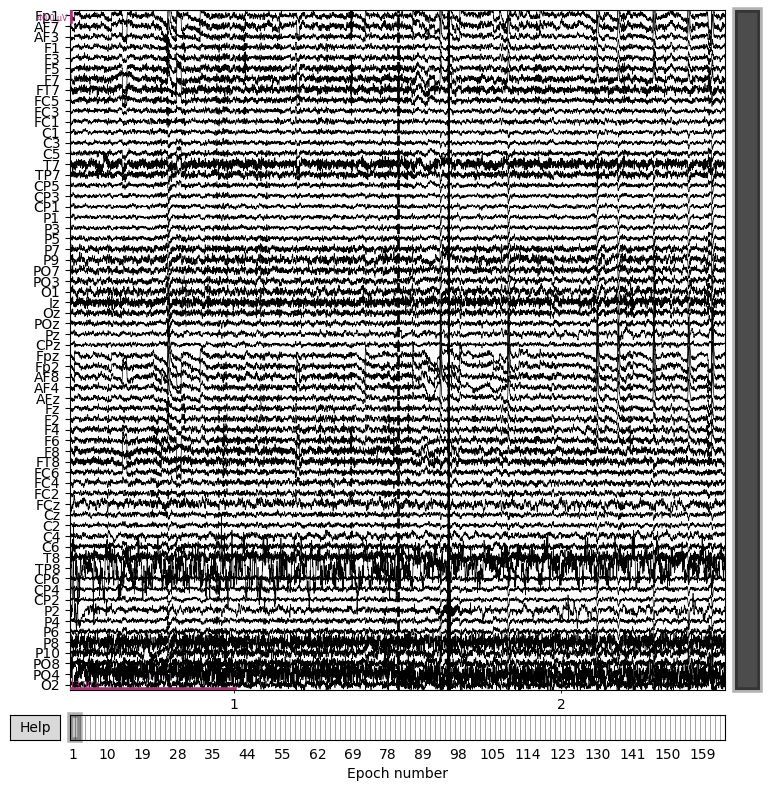

In [18]:
plot41 = p1_epochs.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)
plot42 = p2_epochs.plot(n_epochs=2, scalings=None, n_channels=64, event_color="b", title="Epochs plot", block=True)

In [19]:
plot51 = p1_epochs["coupled"].compute_psd(fmin = 0, fmax = 40).plot(picks="eeg", exclude="bads")
plot52 = p2_epochs["coupled"].compute_psd(fmin = 0, fmax = 40).plot(picks="eeg", exclude="bads")

Using data from preloaded Raw for 32 events and 53249 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Using data from preloaded Raw for 32 events and 53249 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


Using data from preloaded Raw for 32 events and 53249 original time points ...
Not setting metadata
32 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


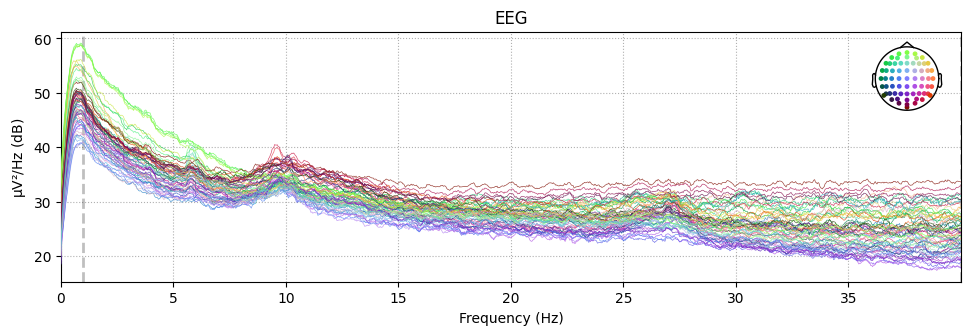

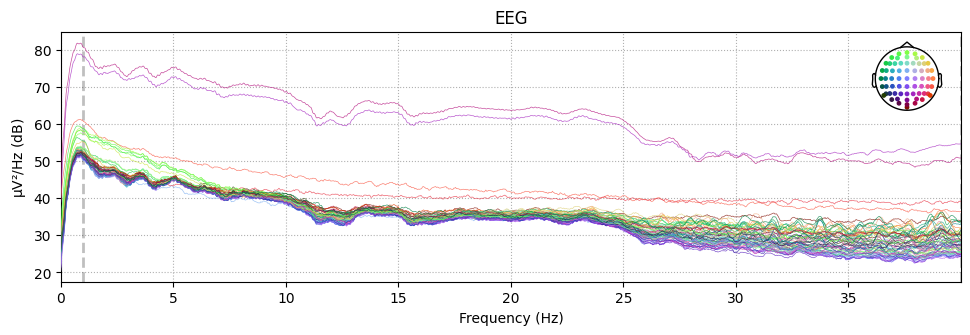

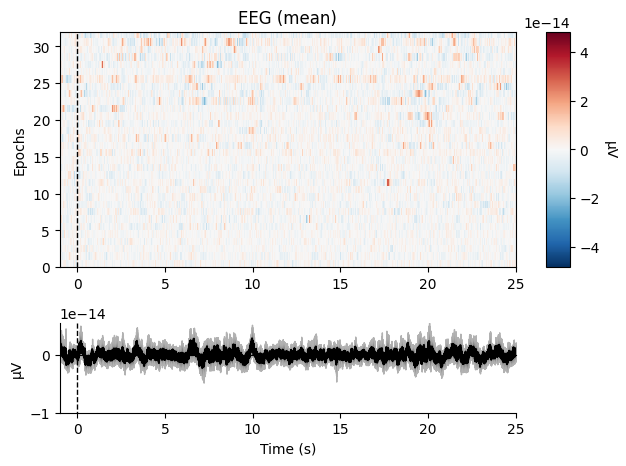

Using data from preloaded Raw for 32 events and 53249 original time points ...
Not setting metadata
32 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


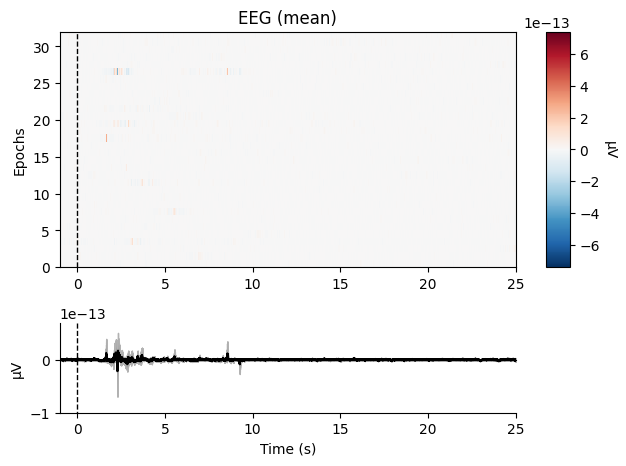

In [20]:
plot61 = p1_epochs["coupled"].plot_image(picks="eeg", combine="mean")
plot62 = p2_epochs["coupled"].plot_image(picks="eeg", combine="mean")

## Select epochs for desired conditions
- For now we'll select the following:
    - Uncoupled
    - Coupled
    - ~~LeaderA/FollowerB~~
    - ~~LeaderB/FollowerA~~

In [21]:
p1_epochs = p1_epochs["uncoupled", "coupled"]
p2_epochs = p2_epochs["uncoupled", "coupled"]

#### Illustrations

/tmp/ipykernel_10948/4222361012.py:1: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot71 = p1_epochs.plot(n_epochs=2, scalings=None, n_channels=64, title="Epochs plot", block=True)


Using data from preloaded Raw for 2 events and 53249 original time points ...


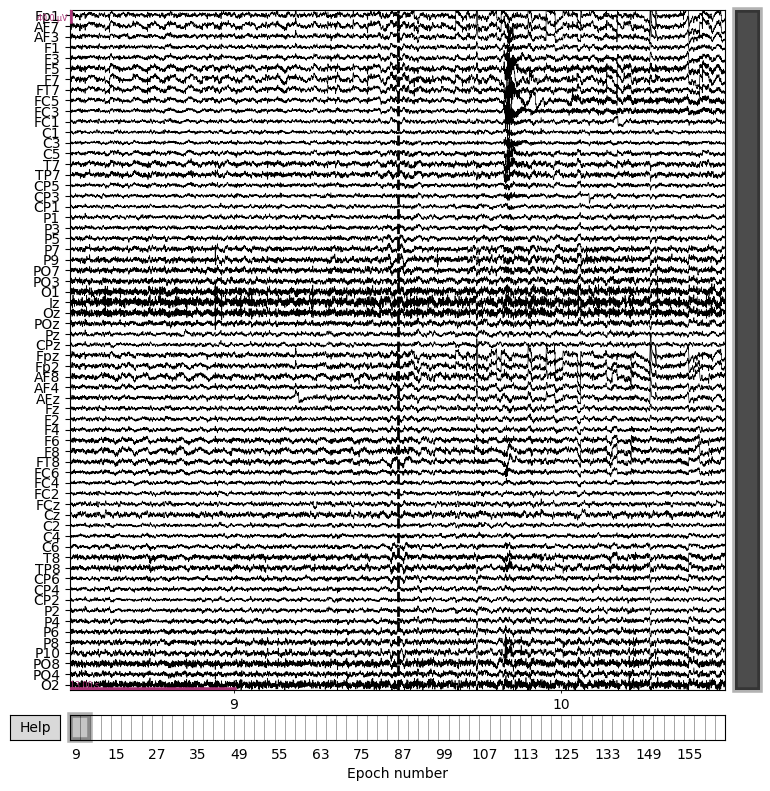

/tmp/ipykernel_10948/4222361012.py:2: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot72 = p2_epochs.plot(n_epochs=2, scalings=None, n_channels=64, title="Epochs plot", block=True)


Using data from preloaded Raw for 2 events and 53249 original time points ...


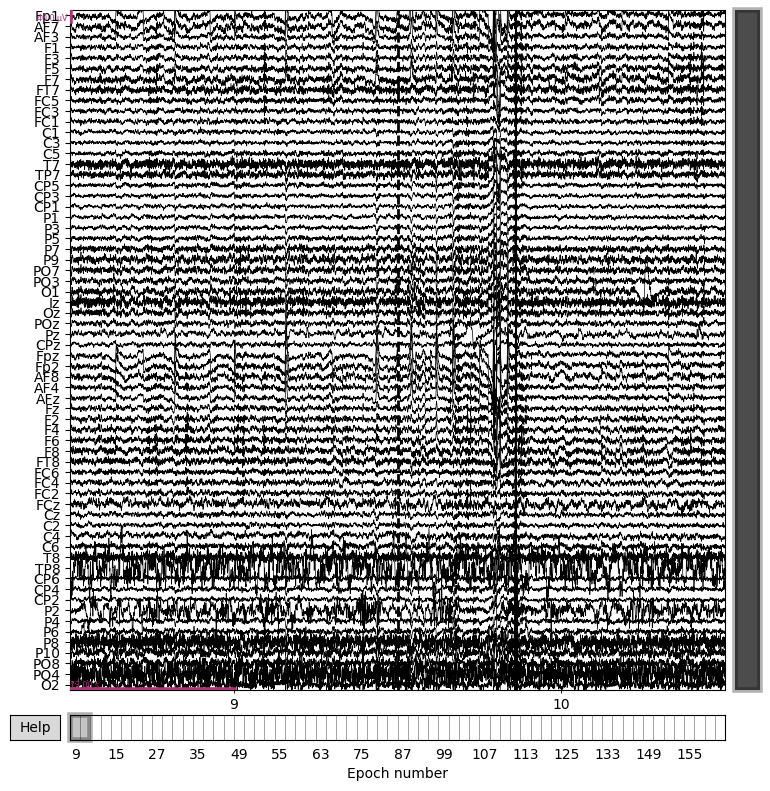

In [22]:
plot71 = p1_epochs.plot(n_epochs=2, scalings=None, n_channels=64, title="Epochs plot", block=True)
plot72 = p2_epochs.plot(n_epochs=2, scalings=None, n_channels=64, title="Epochs plot", block=True)

## Downsample to 256 Hz

In [23]:
print('Original sampling rate:', p1_epochs.info['sfreq'], 'Hz')

Original sampling rate: 2048.0 Hz


In [24]:
p1_epochs_resampled = p1_epochs.copy().load_data().resample(256)
p2_epochs_resampled = p2_epochs.copy().load_data().resample(256)

Using data from preloaded Raw for 64 events and 53249 original time points ...
Using data from preloaded Raw for 64 events and 53249 original time points ...


#### Illustrations

/tmp/ipykernel_10948/1790705554.py:1: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot81 = p1_epochs_resampled.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


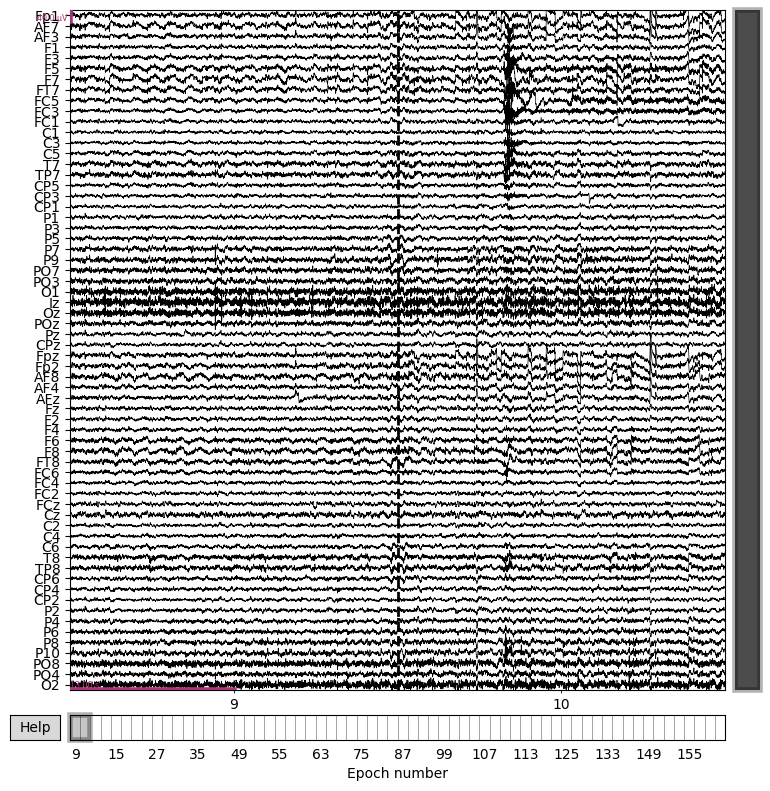

/tmp/ipykernel_10948/1790705554.py:2: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot82 = p2_epochs_resampled.plot(n_epochs=2, scalings=None, n_channels=64, event_color="b", title="Epochs plot", block=True)


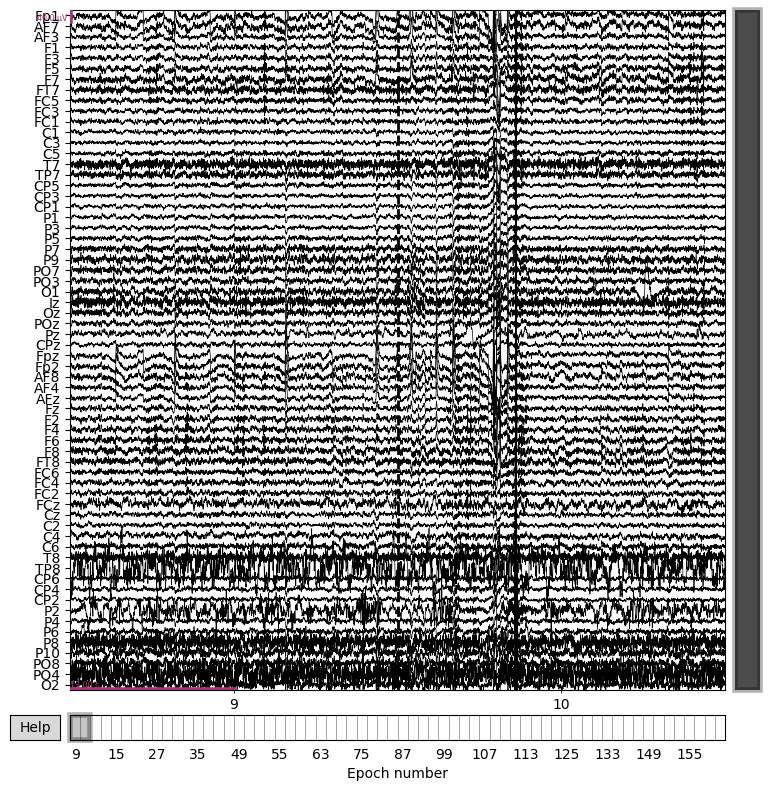

In [25]:
plot81 = p1_epochs_resampled.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)
plot82 = p2_epochs_resampled.plot(n_epochs=2, scalings=None, n_channels=64, event_color="b", title="Epochs plot", block=True)

## Remove Bad EEG channels

In [26]:
p1_epochs_bad_excluded = p1_epochs_resampled.copy().pick_types(eeg=True, exclude='bads')
p2_epochs_bad_excluded = p2_epochs_resampled.copy().pick_types(eeg=True, exclude='bads')

print(p1_epochs_bad_excluded.info)
print(p1_epochs_resampled.info["bads"])
print(p2_epochs_resampled.info["bads"])

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2020-02-01 13:25:51 UTC
 nchan: 64
 projs: Average EEG reference: on
 sfreq: 256.0 Hz
>
[]
[]


## ICA

In [27]:
p1_ica = ICA(n_components=15, method="fastica", max_iter="auto").fit(p1_epochs_bad_excluded)
p2_ica = ICA(n_components=15, method="fastica", max_iter="auto").fit(p2_epochs_bad_excluded)

Fitting ICA to data using 64 channels (please be patient, this may take a while)


/tmp/ipykernel_10948/2831145284.py:1: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  p1_ica = ICA(n_components=15, method="fastica", max_iter="auto").fit(p1_epochs_bad_excluded)


    Applying projection operator with 1 vector (pre-whitener computation)
    Applying projection operator with 1 vector (pre-whitener application)
Selecting by number: 15 components
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 8.8s.
Fitting ICA to data using 64 channels (please be patient, this may take a while)
    Applying projection operator with 1 vector (pre-whitener computation)


/tmp/ipykernel_10948/2831145284.py:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  p2_ica = ICA(n_components=15, method="fastica", max_iter="auto").fit(p2_epochs_bad_excluded)


    Applying projection operator with 1 vector (pre-whitener application)
Selecting by number: 15 components
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 8.1s.


#### Explained variance

In [28]:
p1_epochs.load_data()
explained_var_ratio = p1_ica.get_explained_variance_ratio(p1_epochs_bad_excluded)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f"Fraction of {channel_type} variance explained by all components: " f"{ratio}"
    )

Using data from preloaded Raw for 64 events and 53249 original time points ...
Fraction of eeg variance explained by all components: 0.9515012087958958


In [29]:
explained_var_ratio = p1_ica.get_explained_variance_ratio(
    p1_epochs_bad_excluded, components=[0], ch_type="eeg"
)
# This time, print as percentage.
ratio_percent = round(100 * explained_var_ratio["eeg"])
print(
    f"Fraction of variance in EEG signal explained by first component: "
    f"{ratio_percent}%"
)

Fraction of variance in EEG signal explained by first component: 48%


#### Illustrations

    Applying projection operator with 1 vector (pre-whitener application)
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


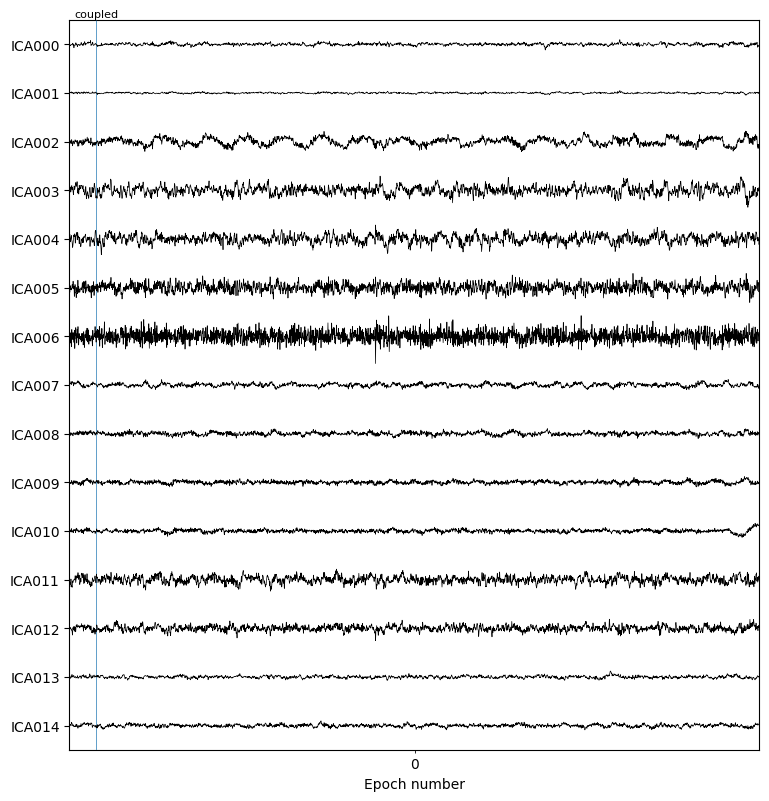

    Applying projection operator with 1 vector (pre-whitener application)
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


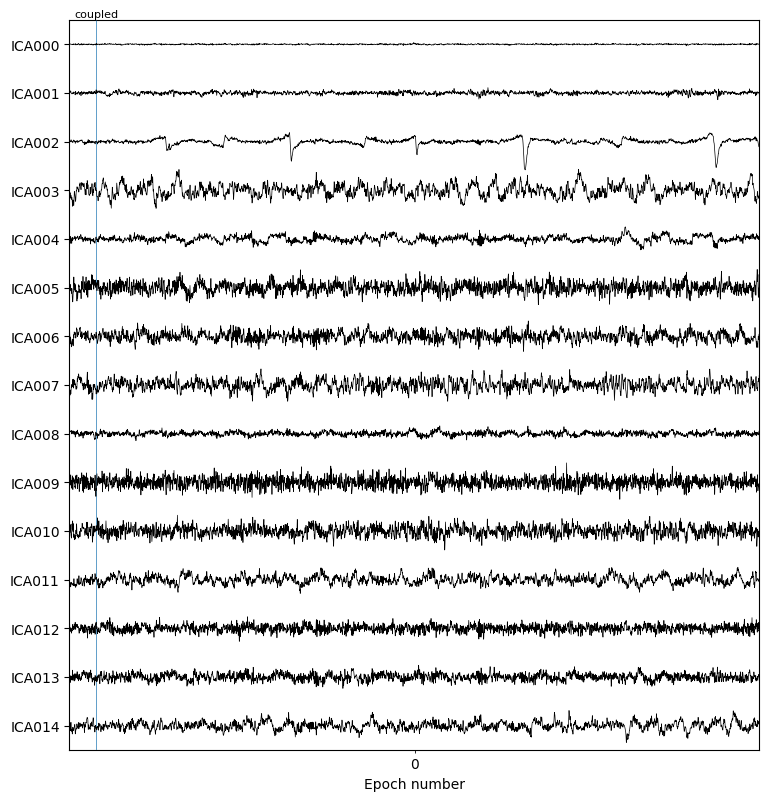

In [30]:
plot91 = p1_ica.plot_sources(p1_epochs_bad_excluded[0], show_scrollbars=False)
plto92 = p2_ica.plot_sources(p2_epochs_bad_excluded[0], show_scrollbars=False)

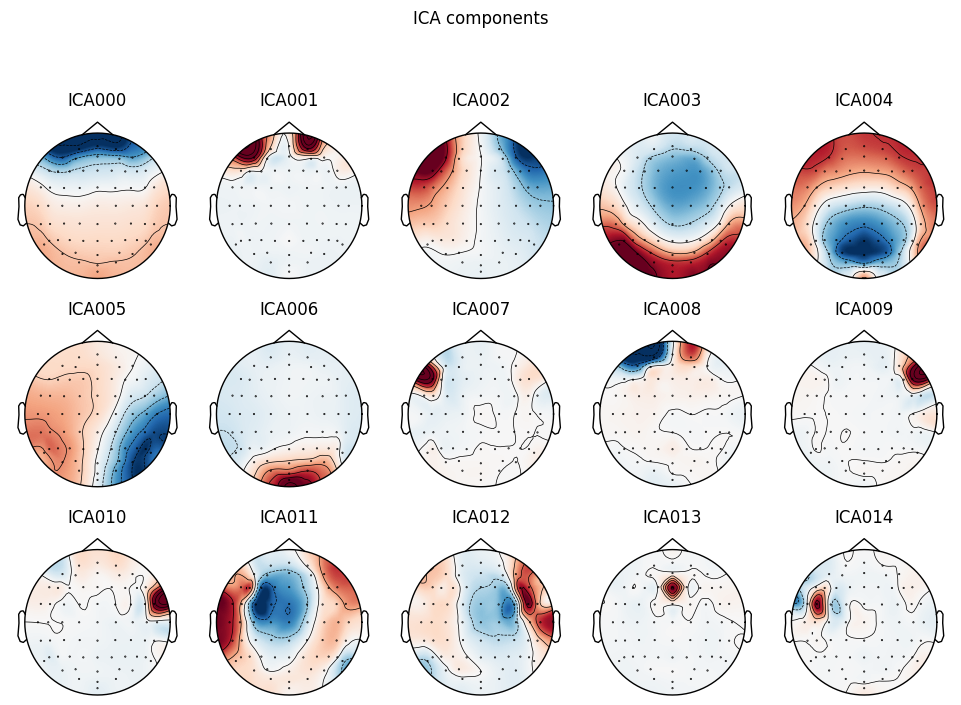

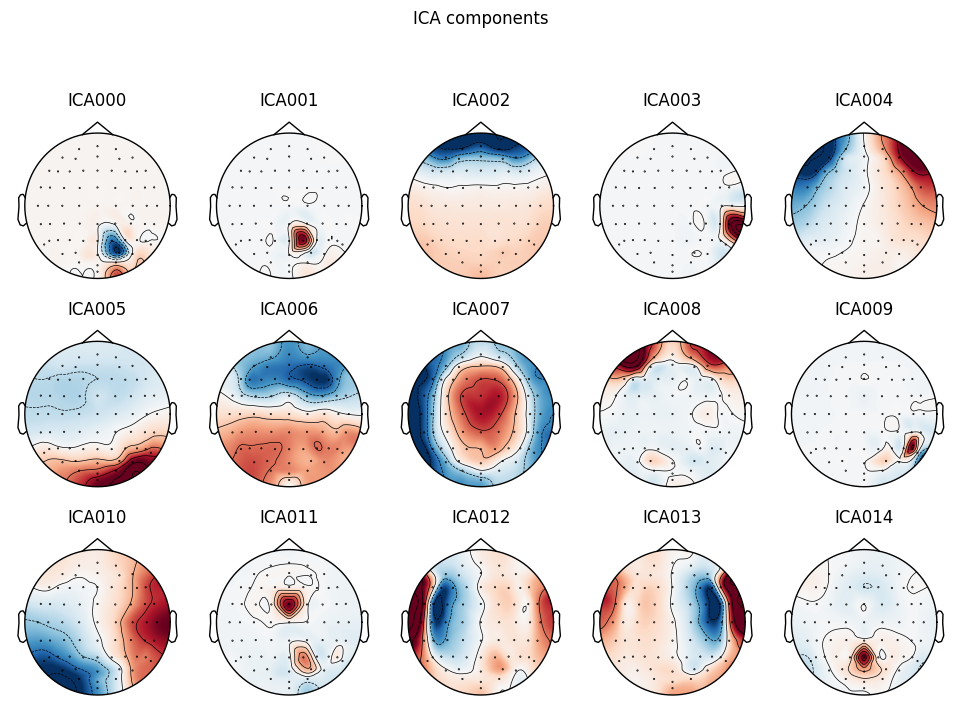

In [31]:
plot101 = p1_ica.plot_components()
plot102 = p2_ica.plot_components()

#### Automatic Labelling

In [32]:
# Label the individual components using the ICLabel algorithm
p1_ic_labels = label_components(p1_epochs_bad_excluded, p1_ica, method='iclabel')
p2_ic_labels = label_components(p2_epochs_bad_excluded, p2_ica, method='iclabel')

/tmp/ipykernel_10948/2452218424.py:2: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  p1_ic_labels = label_components(p1_epochs_bad_excluded, p1_ica, method='iclabel')
/tmp/ipykernel_10948/2452218424.py:2: RuntimeWarning: The provided Epochs instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  p1_ic_labels = label_components(p1_epochs_bad_excluded, p1_ica, method='iclabel')
/tmp/ipykernel_10948/2452218424.py:2: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the '

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/tmp/ipykernel_10948/2452218424.py:3: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  p2_ic_labels = label_components(p2_epochs_bad_excluded, p2_ica, method='iclabel')
/tmp/ipykernel_10948/2452218424.py:3: RuntimeWarning: The provided Epochs instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  p2_ic_labels = label_components(p2_epochs_bad_excluded, p2_ica, method='iclabel')
/tmp/ipykernel_10948/2452218424.py:3: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the '

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [33]:
p1_labels = p1_ic_labels["labels"]
p2_labels = p2_ic_labels["labels"]
p1_exclude_idx = [idx for idx, label in enumerate(p1_labels) if label in ["eye blink"]]
print(f"Excluding these ICA components for P1: {p1_exclude_idx}")
p2_exclude_idx = [idx for idx, label in enumerate(p2_labels) if label in ["eye blink"]]
print(f"Excluding these ICA components for P2: {p2_exclude_idx}")

Excluding these ICA components for P1: [0, 1, 2, 8]
Excluding these ICA components for P2: [2, 4, 8]


    Applying projection operator with 1 vector (pre-whitener application)
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated


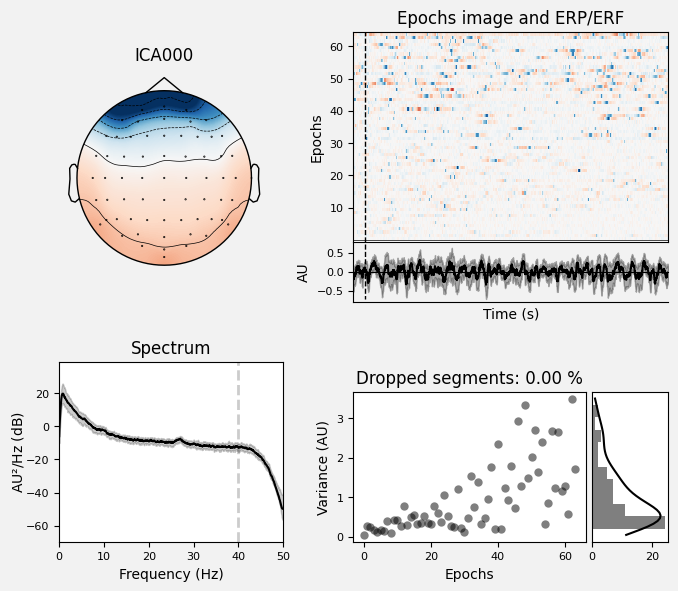

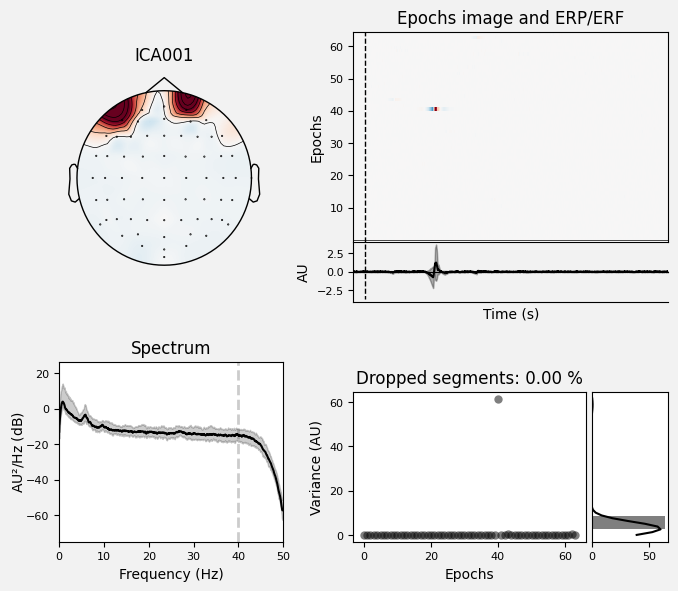

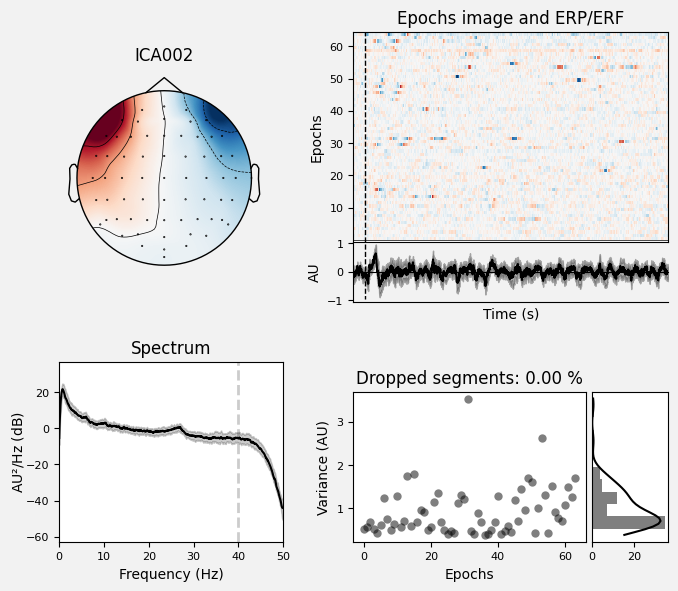

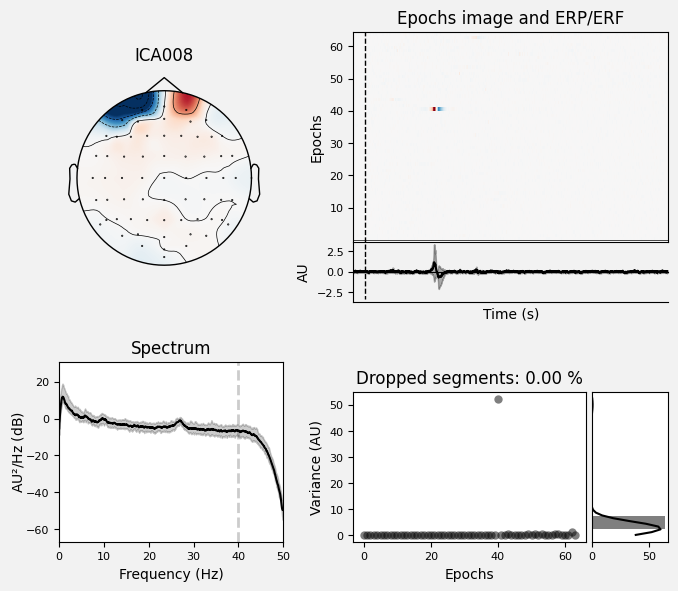

    Applying projection operator with 1 vector (pre-whitener application)
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


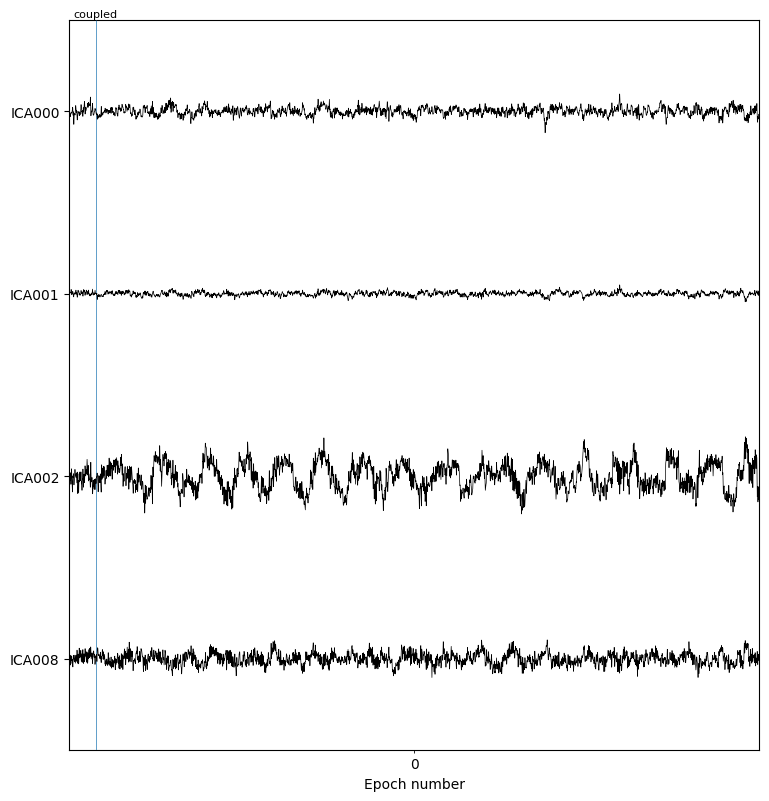

    Applying projection operator with 1 vector (pre-whitener application)
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated


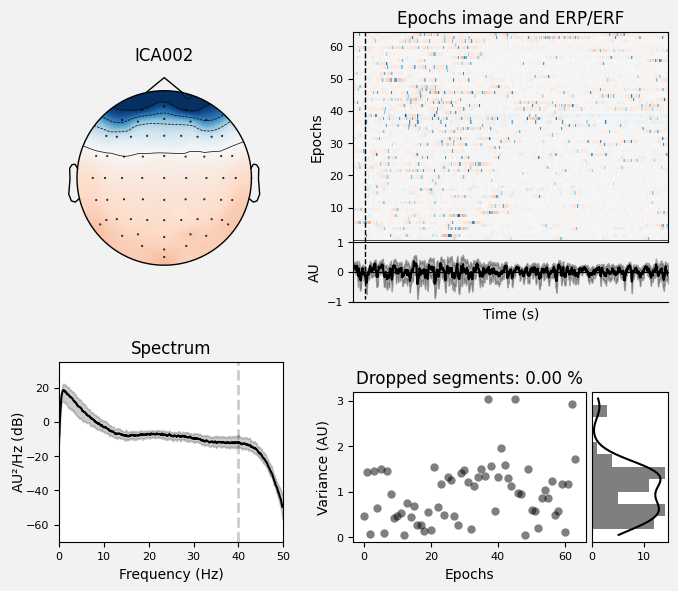

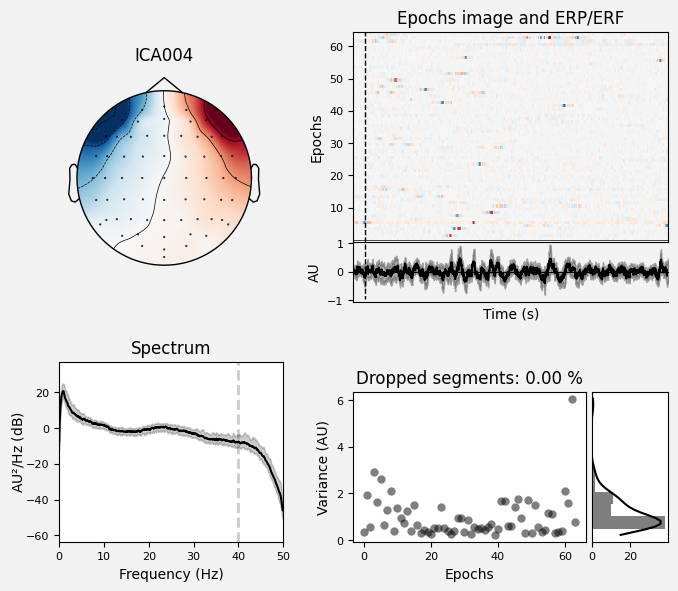

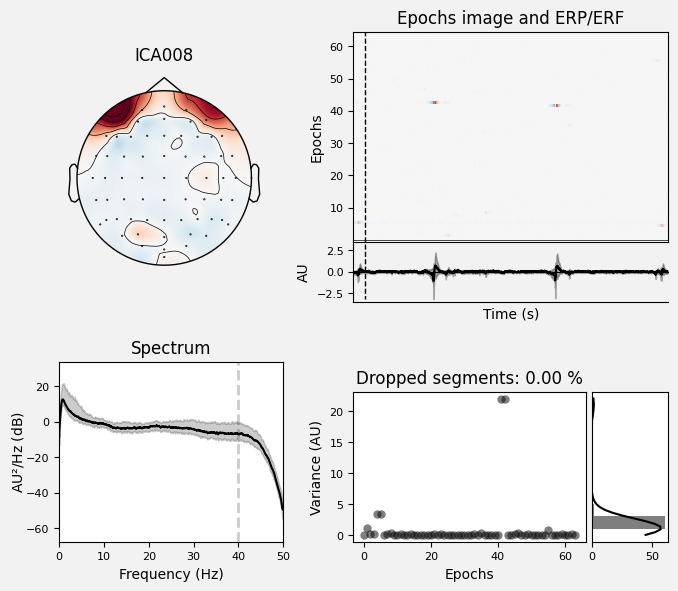

    Applying projection operator with 1 vector (pre-whitener application)
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


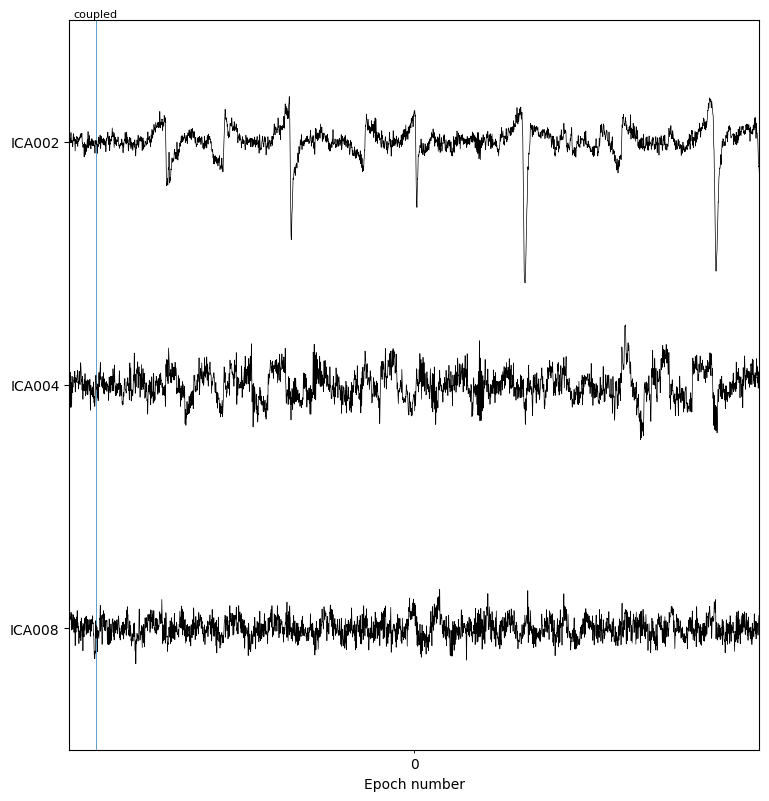

In [34]:
plot111 = p1_ica.plot_properties(p1_epochs_bad_excluded, picks=p1_exclude_idx)
plot112 = p1_ica.plot_sources(p1_epochs_bad_excluded[0], show_scrollbars=False, picks=p1_exclude_idx)
plot113 = p2_ica.plot_properties(p2_epochs_bad_excluded, picks=p2_exclude_idx)
plot114 = p2_ica.plot_sources(p2_epochs_bad_excluded[0], show_scrollbars=False, picks=p2_exclude_idx)

### Exclude Independent Components
Here we will work with epochs_resampled again since it should also contain the bad eeg channels that were only removed for ICA

In [35]:
p1_ica.exclude = p1_exclude_idx
p1_epochs_reconst = p1_epochs_resampled.copy()
p1_ica.apply(p1_epochs_reconst)

p2_ica.exclude = p2_exclude_idx
p2_epochs_reconst = p2_epochs_resampled.copy()
p2_ica.apply(p2_epochs_reconst)

Applying ICA to Epochs instance


/tmp/ipykernel_10948/848522828.py:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  p1_ica.apply(p1_epochs_reconst)


    Applying projection operator with 1 vector (pre-whitener application)
    Transforming to ICA space (15 components)
    Zeroing out 4 ICA components
    Projecting back using 64 PCA components
Applying ICA to Epochs instance


/tmp/ipykernel_10948/848522828.py:7: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  p2_ica.apply(p2_epochs_reconst)


    Applying projection operator with 1 vector (pre-whitener application)
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 64 PCA components


Number of events,64
Events,coupled: 32uncoupled: 32
Time range,-1.000 – 24.996 s
Baseline,-1.000 – 0.000 s


#### Illustrations

/tmp/ipykernel_10948/373764047.py:1: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot121 = p1_epochs_resampled[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


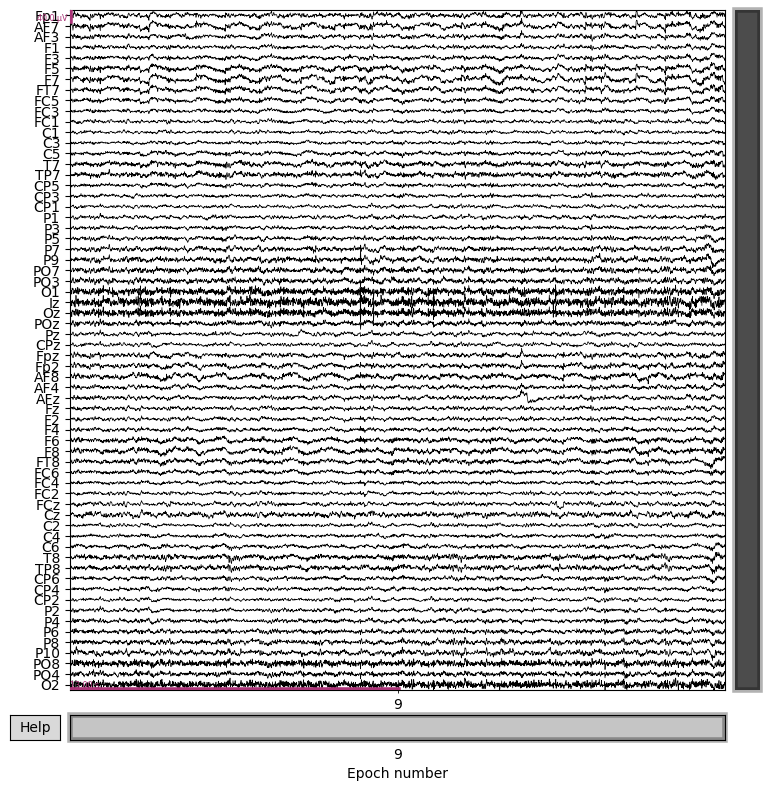

/tmp/ipykernel_10948/373764047.py:2: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot122 = p1_epochs_reconst[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


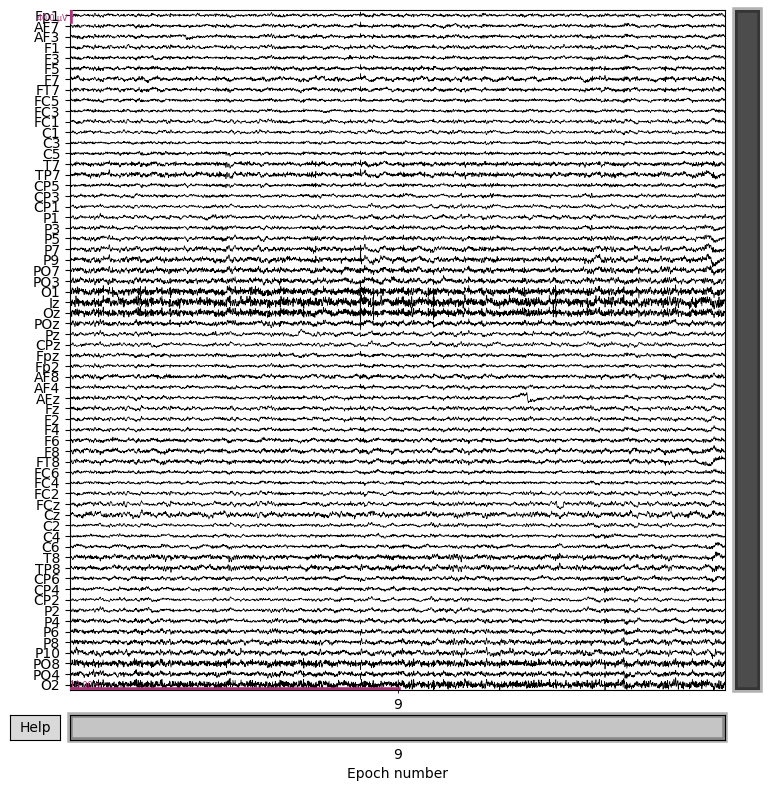

/tmp/ipykernel_10948/373764047.py:3: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot123 = p2_epochs_resampled[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


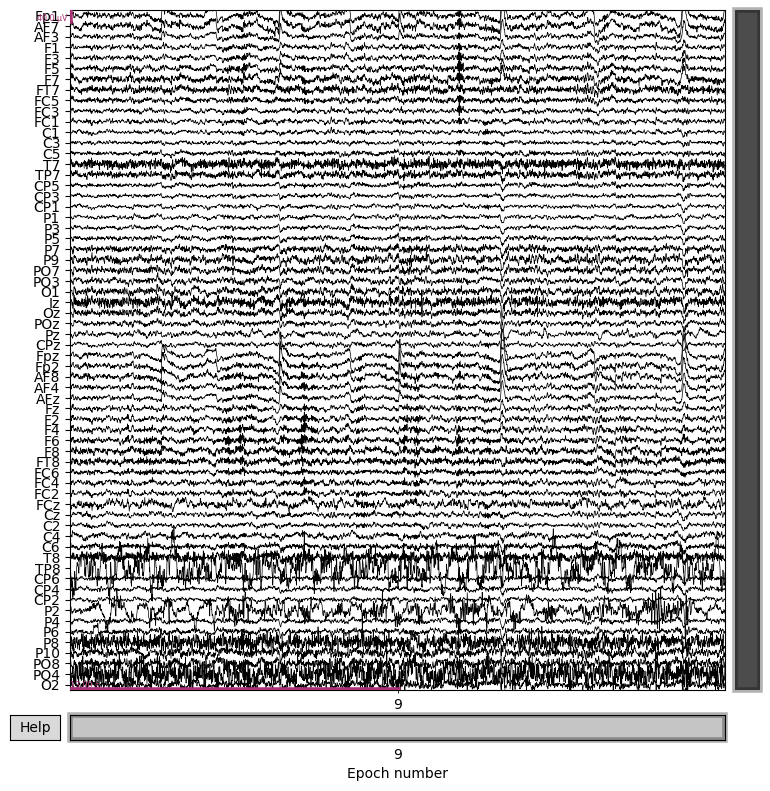

/tmp/ipykernel_10948/373764047.py:4: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot124 = p2_epochs_reconst[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


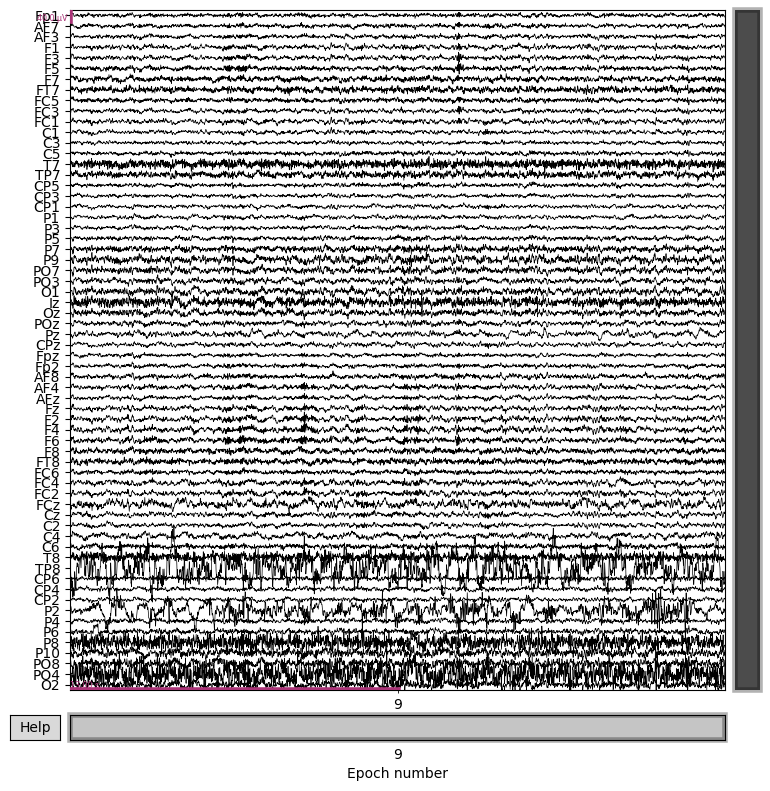

In [36]:
plot121 = p1_epochs_resampled[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)
plot122 = p1_epochs_reconst[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)
plot123 = p2_epochs_resampled[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)
plot124 = p2_epochs_reconst[0].plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)

## Interpolate Bad EEG Channels

In [37]:
p1_epochs_interp = p1_epochs_reconst.copy().interpolate_bads(reset_bads=False)
p2_epochs_interp = p2_epochs_reconst.copy().interpolate_bads(reset_bads=False)

/tmp/ipykernel_10948/2154583860.py:1: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  p1_epochs_interp = p1_epochs_reconst.copy().interpolate_bads(reset_bads=False)
/tmp/ipykernel_10948/2154583860.py:2: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  p2_epochs_interp = p2_epochs_reconst.copy().interpolate_bads(reset_bads=False)


## Reference

In [38]:
# Average referencing
p1_epochs_avg_ref = p1_epochs_interp.copy().set_eeg_reference(ref_channels="average")
p2_epochs_avg_ref = p2_epochs_interp.copy().set_eeg_reference(ref_channels="average")

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Removing existing average EEG reference projection.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Removing existing average EEG reference projection.


#### Illustrations

/tmp/ipykernel_10948/1915875735.py:1: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot131 = p1_epochs_avg_ref.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


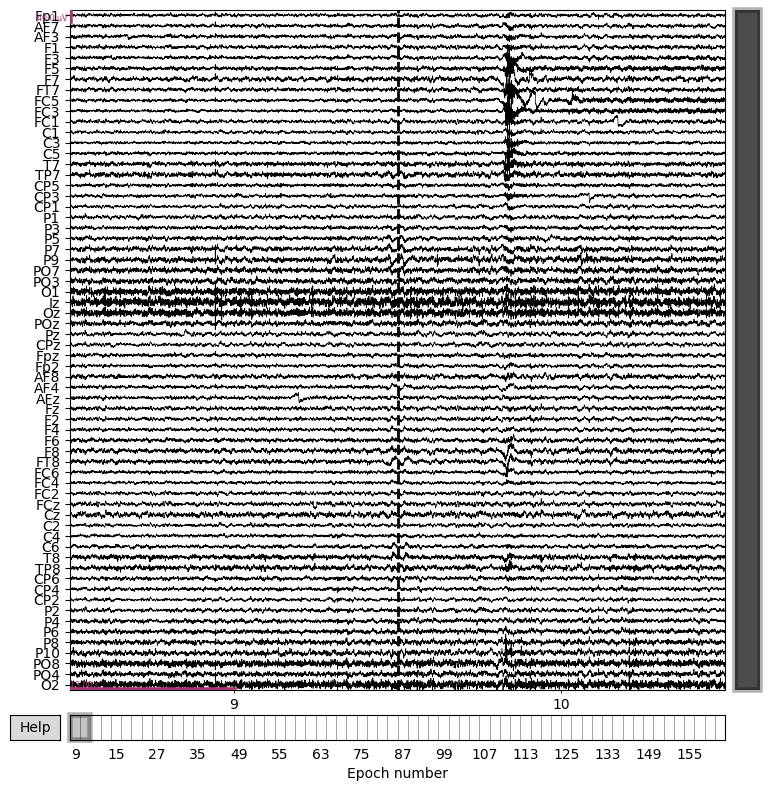

/tmp/ipykernel_10948/1915875735.py:2: FutureWarning: The current default events=None is deprecated and will change to events=True in MNE 1.6. Set events=False to suppress this warning.
  plot132 = p2_epochs_avg_ref.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)


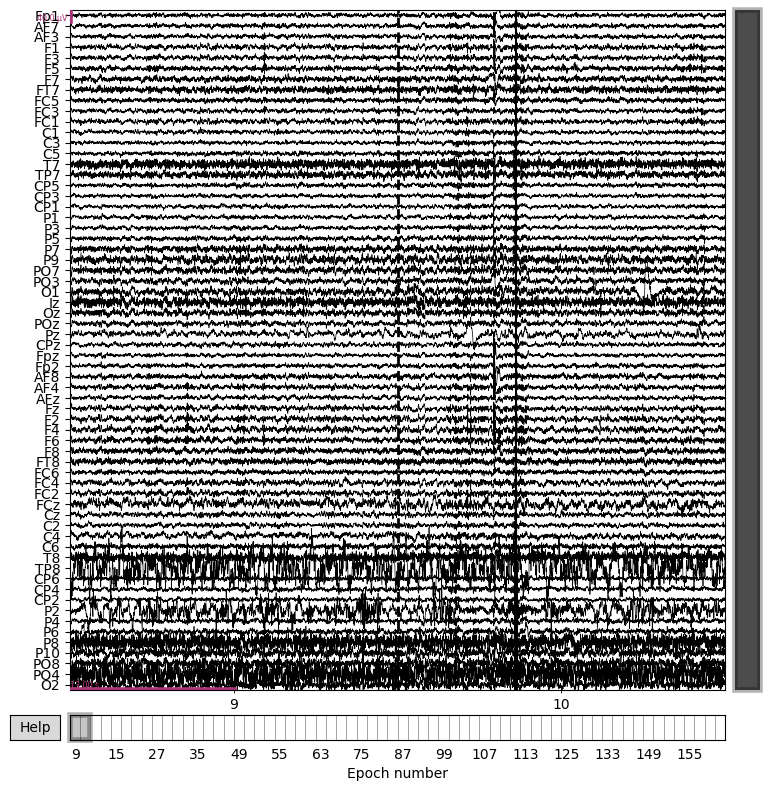

In [39]:
plot131 = p1_epochs_avg_ref.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)
plot132 = p2_epochs_avg_ref.plot(n_epochs=2, scalings=None, n_channels=64, event_color="r", title="Epochs plot", block=True)

## Exporting The Data

In [40]:
p1_fname = "Pre-processed/pair"+PAIR_NUMBER +"_p1_pre-processed.fif"
p1_epochs_avg_ref.save(fname=p1_fname, overwrite=False)
p2_fname = "Pre-processed/pair"+PAIR_NUMBER+"_p2_pre-processed.fif"
p2_epochs_avg_ref.save(fname=p2_fname, overwrite=False)

/tmp/ipykernel_10948/1073210142.py:2: RuntimeWarning: This filename (Pre-processed/pair007_p1_pre-processed.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  p1_epochs_avg_ref.save(fname=p1_fname, overwrite=False)
/tmp/ipykernel_10948/1073210142.py:4: RuntimeWarning: This filename (Pre-processed/pair007_p2_pre-processed.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  p2_epochs_avg_ref.save(fname=p2_fname, overwrite=False)
